# CGAN

CGAN (Conditional Generative Adversarial Network) is a type of generative model that incorporates conditional information to generate images. Specifically, it generates images by taking both random noise and a class label as inputs, and produces an image that corresponds to the given class. In this case, the CGAN is used to generate handwritten digits from the MNIST dataset, conditioned on the class labels (i.e., digits 0 to 9).

The Conditional Generative Adversarial Network (CGAN) is a variant of the original Generative Adversarial Network (GAN) architecture, which was first proposed in 2014 by Ian Goodfellow and his colleagues.

In a traditional GAN, the generator learns to create images from random noise, while the discriminator learns to distinguish between real and generated images. In a CGAN, the generator also takes as input a condition, such as a label or a class, in addition to the random noise. This allows the generator to learn to generate images based on specific conditions, leading to more controlled and targeted image generation.

The CGAN was proposed in a 2014 paper titled "Conditional Generative Adversarial Nets" by Mehdi Mirza and Simon Osindero. The authors demonstrated the effectiveness of the CGAN on various tasks, such as generating images of specific digits in the MNIST dataset conditioned on the corresponding digit label.

Since then, the CGAN has been widely used in various applications, including image synthesis, image editing, and style transfer.

## Library Packages

Here's a brief explanation of the imported packages:

- torch is the main PyTorch package.

- torch.nn is a subpackage of torch that contains many useful classes for building neural networks.

- torch.nn.functional is another subpackage of torch that contains many useful functions for building neural networks.

- torch.utils.data provides an interface for loading and iterating over datasets.

- torch.autograd provides automatic differentiation for all operations on Tensors.

- torchvision is a package that provides access to popular datasets, model architectures, and image transformations for computer vision.

- numpy is a popular package for numerical computing in Python.

- math is a built-in Python package that provides various mathematical functions.

- os is a built-in Python package for interacting with the operating system.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.autograd import Variable

from torchvision import datasets
import torchvision.transforms as transforms
from torchvision.utils import save_image

import numpy as np
import math
import os

cuda = True if torch.cuda.is_available() else False

## Configure Data Loader

This code is used to configure the data loader for the MNIST dataset, which is commonly used for training machine learning models to recognize handwritten digits.

The first line sets the batch size to 64, which means that the model will be trained on 64 images at a time.

The next few lines define the size and shape of the input images, which in this case are 28x28 grayscale images. The os.makedirs line creates a directory to store the MNIST dataset if it doesn't already exist.

The transforms variable defines a series of image transformations that will be applied to each image in the dataset. In this case, the images are resized to 28x28, converted to a tensor, and then normalized to have a mean of 0.5 and a standard deviation of 0.5. The transforms.Compose function combines these transformations into a single transformation pipeline.

The mnist_dataset variable creates an instance of the MNIST dataset using the datasets.MNIST function, which loads the dataset from disk and applies the specified transformations to each image. The train=True argument indicates that we want to load the training set.

Finally, the dataloader variable creates an instance of the PyTorch DataLoader class, which provides an iterator over the MNIST dataset. The batch_size argument specifies the number of images to load at a time, and the shuffle=True argument indicates that we want to randomly shuffle the images between epochs.



In [12]:
# Configure data loader
batch_size = 64

img_size = 28
channels = 1
img_shape = (channels, img_size, img_size)

os.makedirs("data/mnist", exist_ok=True)

transforms = transforms.Compose([transforms.Resize(img_size), 
                              transforms.ToTensor(), 
                              transforms.Normalize([0.5], [0.5])]
                             )

mnist_dataset = datasets.MNIST("data/mnist",
                               train=True,
                               download=True,
                               transform=transforms)

dataloader = torch.utils.data.DataLoader(mnist_dataset,
                                         batch_size=batch_size,
                                         shuffle=True)

100%|██████████| 9912422/9912422 [00:19<00:00, 511960.49it/s]


Extracting data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to data/mnist/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 12465084.77it/s]

Extracting data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to data/mnist/MNIST/raw



100%|██████████| 1648877/1648877 [00:02<00:00, 551531.96it/s]


Extracting data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to data/mnist/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 2494177.63it/s]

Extracting data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/mnist/MNIST/raw



## Visualise Data

- dataloader is assumed to be an instance of a PyTorch DataLoader object, which provides an iterable over a dataset.
next(examples) retrieves the next batch of data and targets from the dataloader. The enumerate function is used to keep track of the current batch index.

- A new matplotlib figure is created using fig = plt.figure().

- The for loop iterates over the first 6 images in the batch, and for each image:

- A new subplot is created using plt.subplot(2,3,i+1) to arrange the images in a 2x3 grid.

- plt.tight_layout() is used to ensure that the subplots don't overlap.

- The image is displayed using plt.imshow() with the grayscale colormap (cmap='gray') and no interpolation (interpolation='none').

- The corresponding label is displayed as the subplot title using plt.title().

- The x and y tick labels are removed using plt.xticks([]) and plt.yticks([]).

Finally, plt.show() is called to display the figure.
This code can be used to quickly visualize a batch of images and their corresponding labels, which can be helpful for verifying that the data is being loaded correctly and to gain insight into the characteristics of the data.

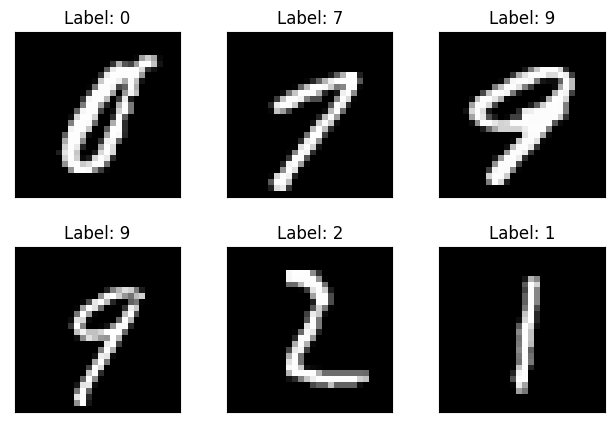

In [13]:
import matplotlib.pyplot as plt

examples = enumerate(dataloader)
batch_idx, (example_data, example_targets) = next(examples)

fig = plt.figure()
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.tight_layout()
    plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
    plt.title("Label: {}".format(example_targets[i]))
    plt.xticks([])
    plt.yticks([])

plt.show()

## Generator 

This is a PyTorch implementation of a generator network for a conditional generative adversarial network (cGAN). The generator takes as input a noise vector noise and a label vector labels, and produces an image that corresponds to the specified label.

- The Generator class inherits from nn.Module, which is the base class for all neural network modules in PyTorch.

- The constructor of the Generator class takes two arguments: n_classes, which is the number of classes or labels in the dataset, and latent_dim, which is the dimensionality of the input noise vector.

- An embedding layer is created using nn.Embedding to convert each class label into a dense vector representation.

- The block function is defined to create a block of layers for the generator. Each block consists of a linear layer, a batch normalization layer (if normalize=True), and a leaky ReLU activation function with a negative slope of 0.2.

- The generator's architecture is defined using nn.Sequential. It consists of four blocks of layers that progressively increase the spatial resolution of the output, followed by a linear layer and a hyperbolic tangent (nn.Tanh()) activation function that maps the output to the range [-1, 1].

- In the forward method, the label embedding and noise vectors are concatenated along the last dimension using torch.cat(). The resulting tensor is then passed through the generator's layers to produce an output tensor. The output tensor is reshaped using img.view() to match the desired output shape of the generator.
Overall, this code defines a generator network for a cGAN that can take a noise vector and a label vector as input and produce an image that corresponds to the specified label.


In [14]:
class Generator(nn.Module):
    def __init__(self, n_classes, latent_dim):
        super(Generator, self).__init__()

        self.label_emb = nn.Embedding(n_classes, n_classes)

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(latent_dim + n_classes, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        # Concatenate label embedding and image to produce input
        gen_input = torch.cat((self.label_emb(labels), noise), -1)
        img = self.model(gen_input)
        img = img.view(img.size(0), *img_shape)
        return img

## Discriminator 

This is a PyTorch implementation of a discriminator network for a conditional generative adversarial network (cGAN). The discriminator takes as input an image img and a label vector labels, and produces a scalar value that indicates the likelihood of the image being real or fake, conditioned on the specified label.

- The Discriminator class inherits from nn.Module, which is the base class for all neural network modules in PyTorch.

- The constructor of the Discriminator class takes one argument: n_classes, which is the number of classes or labels in the dataset.

- An embedding layer is created using nn.Embedding to convert each class label into a dense vector representation.

- The discriminator's architecture is defined using nn.Sequential. It consists of three fully connected layers with leaky ReLU activation functions and dropout layers, followed by a linear layer with a single output that produces a scalar value indicating the likelihood of the input being real or fake.

- In the forward method, the label embedding and image are concatenated along the last dimension using torch.cat(). 

- The resulting tensor is then passed through the discriminator's layers to produce a scalar value that indicates the likelihood of the input being real or fake, conditioned on the specified label.
Overall, this code defines a discriminator network for a cGAN that can take an image and a label vector as input and produce a scalar value indicating the likelihood of the input being real or fake, conditioned on the specified label.


In [15]:
class Discriminator(nn.Module):
    def __init__(self, n_classes):
        super(Discriminator, self).__init__()

        self.label_embedding = nn.Embedding(n_classes, n_classes)

        self.model = nn.Sequential(
            nn.Linear(n_classes + int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
        )

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity


## Initializing the GAN

This code initializes the generator and discriminator models, as well as the adversarial loss function, which is used to train the models.

- The z_dim variable is set to 100, which is the dimensionality of the noise vector that is used as input to the generator.

- The n_classes variable is set to the number of classes or labels in the dataset.

- An instance of the Generator class is created, with n_classes and z_dim as input arguments.

- An instance of the Discriminator class is created, with n_classes as an input argument.

- The adversarial_loss variable is set to an instance of torch.nn.MSELoss(), which is the mean squared error loss function.

- If cuda is True, the generator, discriminator, and loss function are moved to the GPU using the cuda() method. This assumes that the GPU is available and has been properly configured.
Overall, this code sets up the generator and discriminator models, as well as the adversarial loss function, in preparation for training the GAN.

In [16]:
z_dim = 100
n_classes = len(mnist_dataset.classes)

# Initialize generator and discriminator
generator = Generator(n_classes=n_classes, 
                      latent_dim=z_dim)

discriminator = Discriminator(n_classes=n_classes)

# Loss functions
adversarial_loss = torch.nn.MSELoss()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()

In [17]:
print(generator, discriminator)

Generator(
  (label_emb): Embedding(10, 10)
  (model): Sequential(
    (0): Linear(in_features=110, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=128, out_features=256, bias=True)
    (3): BatchNorm1d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Linear(in_features=256, out_features=512, bias=True)
    (6): BatchNorm1d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Linear(in_features=512, out_features=1024, bias=True)
    (9): BatchNorm1d(1024, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Linear(in_features=1024, out_features=784, bias=True)
    (12): Tanh()
  )
) Discriminator(
  (label_embedding): Embedding(10, 10)
  (model): Sequential(
    (0): Linear(in_features=794, out_featu

## Train Model

In this code, the optimizers for the generator and discriminator models are defined. The Adam optimizer is used, with a learning rate of 0.0002, and beta1 and beta2 values of 0.5 and 0.999, respectively.

The FloatTensor and LongTensor variables are also defined based on whether cuda is True or False. These variables are used to ensure that the data and labels are on the correct device (GPU or CPU) throughout the training process.

- lr is set to 0.0002, which is the learning rate used for the Adam optimizer.

- b1 and b2 are set to 0.5 and 0.999, respectively, which are the beta1 and beta2 values used for the Adam optimizer.

- optimizer_G is set to an instance of torch.optim.Adam(), which is used to optimize the generator model parameters.

- optimizer_D is set to an instance of torch.optim.Adam(), which is used to optimize the discriminator model parameters.

- The FloatTensor and LongTensor variables are set to torch.cuda.FloatTensor and torch.cuda.LongTensor, respectively, if cuda is True, otherwise they are set to torch.FloatTensor and torch.LongTensor. These variables are used to ensure that the data and labels are on the correct device (GPU or CPU) throughout the training process.





In [18]:
# Optimizers
lr = 0.0002
b1 = 0.5
b2 = 0.999
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

## Saving a Grid of Genertated Images

This function generates and saves a grid of generated images to a file. The function takes two arguments:

- n_row: the number of rows in the output image grid. The grid will contain n_row by n_row images.

- batches_done: the number of training batches that have been completed. This is used to generate a unique filename for the image.
Here's a summary of what's happening in the function:

- The function generates n_row ** 2 random noise vectors, each with a length of z_dim, using NumPy's np.random.normal() function.

- The noise vectors are converted to a PyTorch tensor of type FloatTensor and wrapped in a Variable object. The Variable object is used to keep track of the computation graph and gradients during training.

- An array of labels is created, where each row of the output grid will have the same label. The labels range from 0 to n_row - 1.

- The label array is converted to a PyTorch tensor of type LongTensor and wrapped in a Variable object.

- The generator model is used to generate images from the noise and label tensors, producing a tensor of shape (n_row ** 2, 1, 28, 28).

- The generated images are saved to a file in the images/ directory. The filename is determined by concatenating the value of batches_done with the string ".png". The save_image() function is used to save the images as a grid of n_row by n_row images. The normalize parameter is set to True to scale the pixel values between 0 and 1.


In [19]:
def sample_image(n_row, batches_done):
    """Saves a grid of generated digits ranging from 0 to n_classes"""
    # Sample noise
    z = Variable(FloatTensor(np.random.normal(0, 1, (n_row ** 2, z_dim))))
    # Get labels ranging from 0 to n_classes for n rows
    labels = np.array([num for _ in range(n_row) for num in range(n_row)])
    labels = Variable(LongTensor(labels))
    gen_imgs = generator(z, labels)
    save_image(gen_imgs.data, "images/%d.png" % batches_done, nrow=n_row, normalize=True)

## Loss Function

This code trains a GAN model to generate images of digits from 0 to 9, using the MNIST dataset. The generator produces images from a noise vector and a class label, while the discriminator classifies the images as real or fake, based on their class labels.

During training, the generator and discriminator are trained alternatively. The generator is trained to produce images that fool the discriminator, while the discriminator is trained to distinguish between real and fake images.

The sample_image function generates and saves a grid of 100 images (10 rows and 10 columns) produced by the generator. The function is called every 300 batches and saves the images in a folder named "images".

The training process runs for 200 epochs, where each epoch iterates over the entire dataset. The loss values for the discriminator and generator are printed at every batch.

- n_epochs: The number of epochs (complete passes through the dataset) to train the GAN for.

- imgs: A batch of real images loaded from the MNIST dataset using the DataLoader.

- labels: The labels corresponding to the real images in the current batch.

- batch_size: The size of the current batch.

- valid: A tensor of size (batch_size, 1) filled with ones, used as the target output for the discriminator when training with real images.

- fake: A tensor of size (batch_size, 1) filled with zeros, used as the target output for the discriminator when training with fake images.

- real_imgs: A tensor of size (batch_size, 1, 28, 28) containing the current batch of real images, wrapped in a Variable.

- gen_labels: A tensor of size (batch_size,) containing random labels sampled from the uniform distribution between 0 and n_classes, wrapped in a Variable.

- z: A tensor of size (batch_size, z_dim) containing random noise sampled from the standard normal distribution, wrapped in a Variable.

- gen_imgs: A tensor of size (batch_size, 1, 28, 28) containing the current batch of generated (fake) images, obtained by passing the random noise z and the random labels gen_labels through the generator.

- validity: The output of the discriminator when given the generated images gen_imgs and the corresponding labels gen_labels.

- validity_real: The output of the discriminator when given the real images real_imgs and the corresponding labels labels.

- g_loss: The generator's loss, which measures how well it was able to fool the discriminator into classifying the generated images as real.

- d_real_loss: The discriminator's loss on the real images, which measures how well it was able to distinguish them from the fake images.

- d_fake_loss: The discriminator's loss on the fake images, which measures how well it was able to distinguish them from the real images.

- d_loss: The discriminator's total loss, which is the average of the losses on the real and fake images.

In the training loop, the generator and discriminator models are trained alternately.

First, the generator is trained by generating fake images using random noise and random labels, and passing them through the discriminator to obtain the discriminator's prediction of whether the image is real or fake. The generator's loss is then calculated as the difference between the discriminator's prediction and the true label, which is always 1 (indicating that the image is real).

Next, the discriminator is trained by minimizing the difference between its prediction for real images and 1 (indicating that the image is real), and its prediction for fake images generated by the generator and 0 (indicating that the image is fake). The total loss for the discriminator is the average of the losses for real and fake images.

During training, the loss for both the generator and the discriminator is printed to track the progress of the training. Additionally, every 300 batches, a grid of images generated by the generator is saved to the images directory for visualization.

In [20]:
os.makedirs("images", exist_ok=True)
n_epochs = 200

for epoch in range(n_epochs):
    for i, (imgs, labels) in enumerate(dataloader):

        batch_size = imgs.shape[0]

        # Adversarial ground truths
        valid = Variable(FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False)
        fake = Variable(FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs.type(FloatTensor))
        labels = Variable(labels.type(LongTensor))

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise and labels as generator input
        z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, z_dim))))
        gen_labels = Variable(LongTensor(np.random.randint(0, n_classes, batch_size)))

        # Generate a batch of images
        gen_imgs = generator(z, gen_labels)

        # Loss measures generator's ability to fool the discriminator
        validity = discriminator(gen_imgs, gen_labels)
        g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Loss for real images
        validity_real = discriminator(real_imgs, labels)
        d_real_loss = adversarial_loss(validity_real, valid)

        # Loss for fake images
        validity_fake = discriminator(gen_imgs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(validity_fake, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, n_epochs, i, len(dataloader), d_loss.item(), g_loss.item())
        )

        batches_done = epoch * len(dataloader) + i
        if batches_done % 300 == 0:
            sample_image(n_row=10, batches_done=batches_done)

[Epoch 0/200] [Batch 0/938] [D loss: 0.516524] [G loss: 0.961592]
[Epoch 0/200] [Batch 1/938] [D loss: 0.294624] [G loss: 0.936973]
[Epoch 0/200] [Batch 2/938] [D loss: 0.130488] [G loss: 0.914394]
[Epoch 0/200] [Batch 3/938] [D loss: 0.028155] [G loss: 0.888646]
[Epoch 0/200] [Batch 4/938] [D loss: 0.017105] [G loss: 0.866619]
[Epoch 0/200] [Batch 5/938] [D loss: 0.029057] [G loss: 0.857595]
[Epoch 0/200] [Batch 6/938] [D loss: 0.012847] [G loss: 0.857467]
[Epoch 0/200] [Batch 7/938] [D loss: 0.012405] [G loss: 0.852400]
[Epoch 0/200] [Batch 8/938] [D loss: 0.010895] [G loss: 0.848812]
[Epoch 0/200] [Batch 9/938] [D loss: 0.011764] [G loss: 0.836622]
[Epoch 0/200] [Batch 10/938] [D loss: 0.011015] [G loss: 0.836717]
[Epoch 0/200] [Batch 11/938] [D loss: 0.013115] [G loss: 0.824001]
[Epoch 0/200] [Batch 12/938] [D loss: 0.012274] [G loss: 0.816285]
[Epoch 0/200] [Batch 13/938] [D loss: 0.014943] [G loss: 0.804853]
[Epoch 0/200] [Batch 14/938] [D loss: 0.016006] [G loss: 0.806574]
[Epoc